Exercise work consists of three parts. After each part, take the mini-exam available in Moodle. The questions concern the exercise so read the instructions carefully and make sure you remember to cover all given tasks. <br>
After the deadline of each mini-exam, example results will be published. This helps you to move to the next part. However, take into account that the deadlines are thus strict, no extensions will be granted! <br>
Two exam points can be acquired from each mini-exam. All three parts of the exercise are compulsory. Completed exercise work from previous years does not apply for this course.

**Deadlines for the mini-exams:**
- Part 1: Fri 9.2.2024 at 23:59
- Part 2: Fri 23.2024 at 23:59
- Part 3: Fri 8.3.2024 at 23:59

**If you encounter problems, Google first and if you can’t find an answer, ask for help**
- Moodle area for questions
- pekavir@utu.fi

**Grading**

The exercise covers a part of the grading in this course. The course exam has 5 questions, 6 points of each. Exercise gives at maximum 6 points, i.e. the total score is 36 points.

# Part 1

# Part 2

Import all the packages needed for this notebook in one cell (add the ones you apply):

In [321]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RepeatedKFold, RandomizedSearchCV, GridSearchCV, cross_val_score
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

## Data exploration

Import the training data set prepared in the previous part of the exercise.

In [3]:
df = pd.read_parquet('../training_data/rice_feature_data.parquet')

Standardize the data using Z-score.

In [149]:
scaler = StandardScaler()
numeric_columns = df.columns.drop(['class', 'class_int'])
class_columns = ['class', 'class_int']
df_without_classes = df.drop(columns=class_columns)
st_rice_data = scaler.fit_transform(df_without_classes.values)
st_numeric_df = pd.DataFrame(st_rice_data, columns=numeric_columns)
st_all_df = pd.concat([st_numeric_df, df[class_columns[0]]], axis=1)
st_all_df

,mean_y,var_y,skew_y,kurt_y,mean_cr,var_cr,skew_cr,kurt_cr,mean_cb,var_cb,...,kurt_cb,major_axis_length,minor_axis_length,area,perimeter,equivalent_diameter,compactness,shape_factor1,shape_factor2,class
0,-0.948152,1.915329,-0.062547,-0.679110,0.453400,-0.568412,-0.256721,-0.110919,-0.347248,-0.621204,...,-0.604932,-0.893240,0.100487,-0.468522,-0.872917,-0.440862,0.706325,-0.386533,0.796959,Arb
1,-1.347118,-0.821743,1.812489,0.424837,0.584495,-0.732144,-0.545330,-0.101979,-0.391282,-0.662466,...,-0.252496,-1.212753,-0.539524,-1.055417,-1.409484,-1.189289,0.387001,0.362554,1.546591,Arb
2,-0.555591,0.436351,-0.029175,-0.567986,0.320931,-0.708205,0.013175,-0.103916,-0.682754,-0.637715,...,-0.459847,-0.784997,0.353291,-0.275627,-0.598288,-0.217212,0.767475,-0.550059,0.681135,Arb
3,-0.249396,0.802890,0.449028,-0.538162,0.475757,-0.576262,-0.293341,-0.110794,-0.487126,-0.658353,...,0.043097,-0.842022,-0.143306,-0.538621,-0.732974,-0.524539,0.518885,-0.229363,0.640521,Arb
4,0.473830,1.656969,-0.599919,-0.398386,0.501948,-0.590143,-0.329225,-0.110040,-0.449510,-0.534392,...,-0.482621,-0.405380,0.441792,0.089150,-0.125985,0.182452,0.564523,-0.661920,0.102223,Arb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,-1.050884,-0.398351,0.499713,-0.486972,-0.190070,-0.263001,-0.156737,-0.103152,1.212049,-0.577431,...,0.463776,-1.382542,0.290191,-0.728890,-1.244157,-0.758828,1.315071,-0.490771,1.770836,Kar
496,-0.595071,-0.229068,-1.501377,0.665603,0.130086,-0.318862,-0.190072,-0.107873,0.964422,-0.263567,...,-0.387514,-1.289422,0.463731,-0.583931,-1.099526,-0.579356,1.340434,-0.612503,1.581173,Kar
497,-0.993074,-0.374135,0.656128,-0.327019,0.344359,-0.660275,-0.056274,-0.107054,0.542226,-0.242819,...,-0.196786,-1.132655,0.347493,-0.490192,-1.002111,-0.466586,1.142744,-0.588338,1.172344,Kar
498,-0.067663,2.228652,0.020730,-0.689747,-0.010742,-0.337698,-0.173107,-0.105491,0.504341,-0.009779,...,-0.261415,-1.301695,0.165441,-0.752202,-1.186759,-0.788305,1.092005,-0.363180,1.659777,Kar


### Histograms

Plot a histogram for each Z-scored feature. Plot all rice species in the same figure and use different color for each.

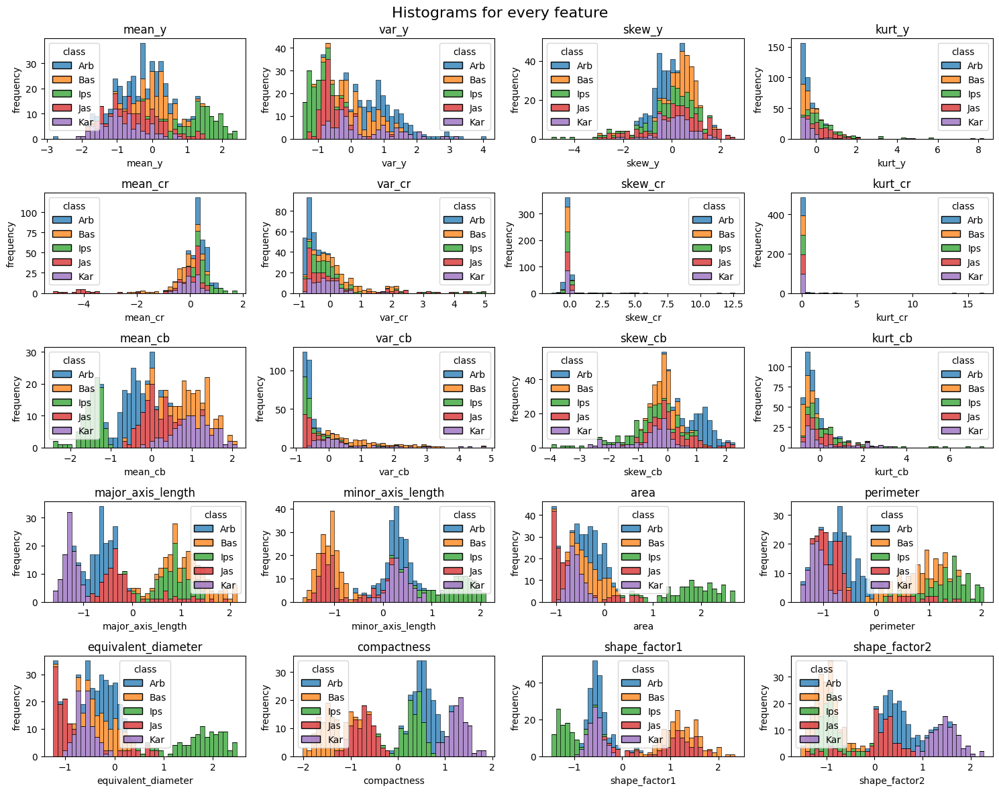

In [101]:
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(15,12))
axes = axes.flatten()
plt.title('jou')
for i,col in enumerate(numeric_columns):

    sns.histplot(data=st_all_df, x=col, hue='class', bins=40, multiple='stack', ax=axes[i])
    axes[i].set_title(f'{col}')
    axes[i].set_ylabel('frequency')

plt.suptitle('Histograms for every feature', fontsize=16)
plt.tight_layout()
plt.show()

Which features may have some discriminative power over rice species according to the histograms?

I would say minor_axis_length, area and equivalent_diameter are all discriminative towards Ipsala, especially EQUIVALENT_DIAMETER.

### Pairplot

Plot pairplots, each Z-scored feature against each Z-scored feature. Are there any correlating features according to the pairplot?

In [109]:
first_ten = st_all_df.columns[:10]
last_ten = st_all_df.columns[10:20]

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/mt/nj0yz9qj6gq5f_z71v1yp34w0000gn/T/ipykernel_41260/3038582621.py:2: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


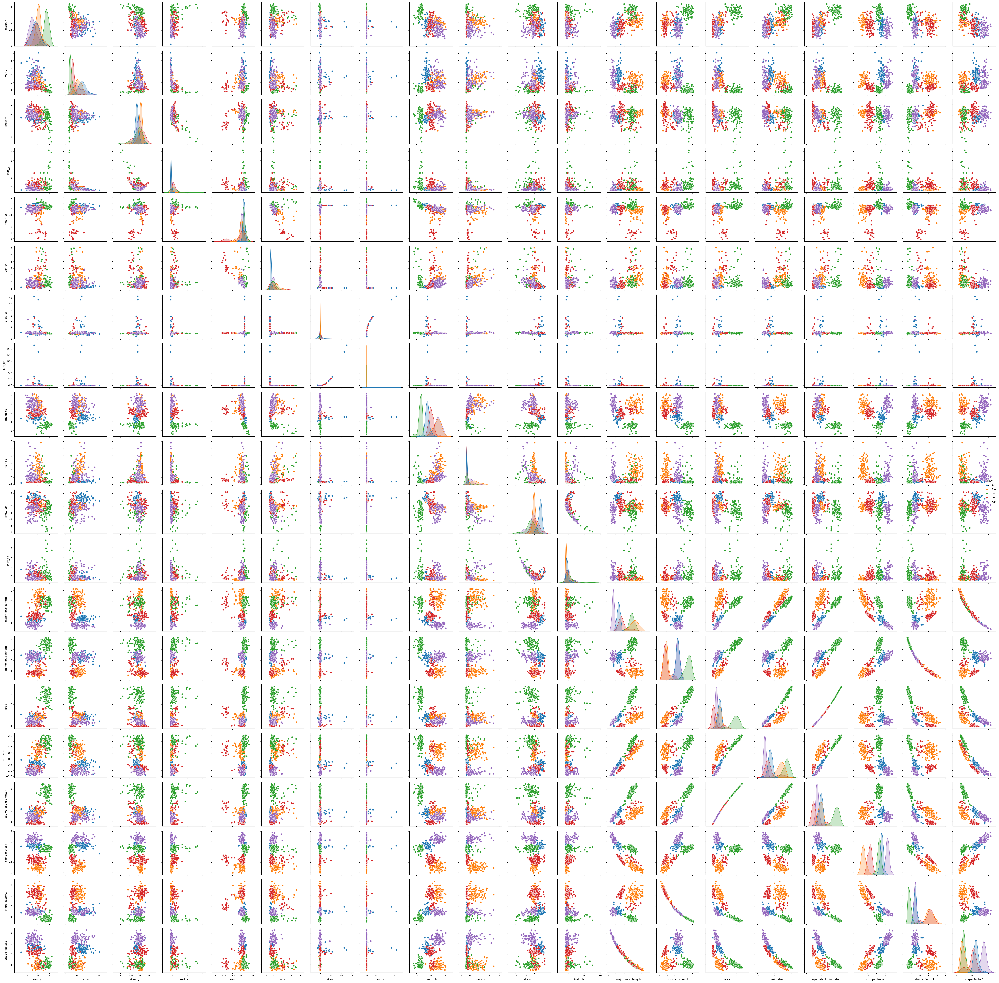

In [113]:
sns.pairplot(st_all_df, hue='class')
plt.tight_layout()
plt.show()

Positive correlation: (area, equivalent_diameter)

Negative correlation: (major_axis_length, shape_factor2), (minor_axis_legth, shape_factor1), (perimeter, shape2)

### PCA

Fit PCA using two principal components (remember to use Z-scored feature values). <br>
Plot the PCA figure with two components, and color the data points according to their species. <br>
Show the legend and label the axes.
Save the figure as a png-file.

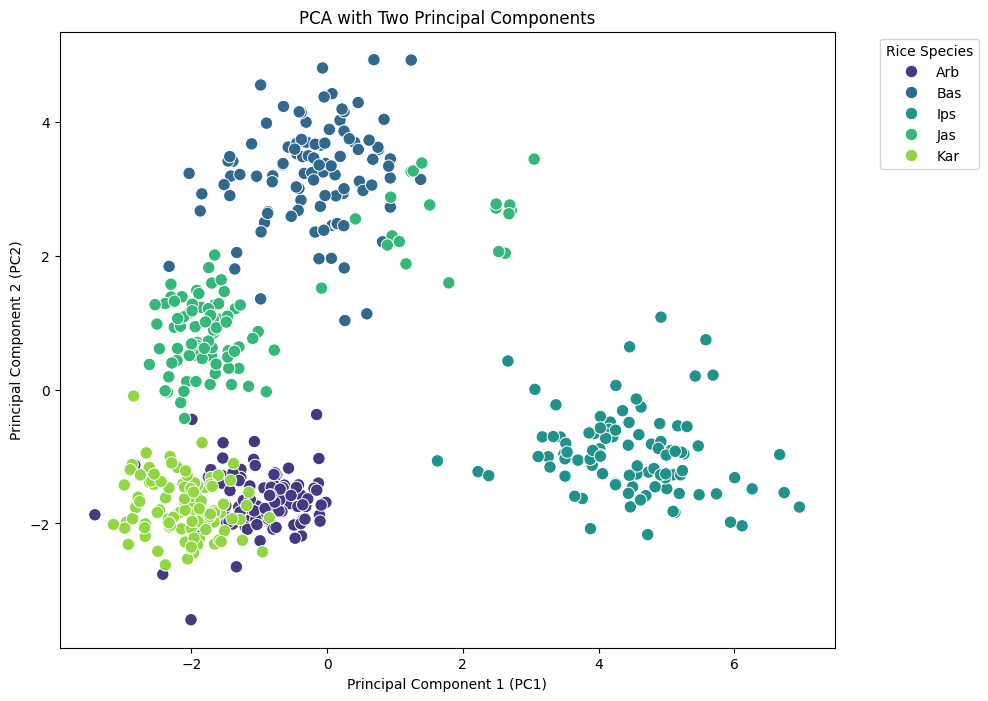

In [133]:
pca = PCA(n_components=2)
pca_results = pca.fit_transform(st_numeric_df)
pca_df = pd.DataFrame(data=pca_results, columns=['PC1', 'PC2'])
pca_df['class'] = df['class']

plt.figure(figsize=(10, 8))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='class', palette='viridis', s=80)
plt.title('PCA with Two Principal Components')
plt.xlabel('Principal Component 1 (PC1)')
plt.ylabel('Principal Component 2 (PC2)')
plt.legend(title='Rice Species', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.savefig('pca_plot.png', bbox_inches='tight')

plt.show()

Can you see any clusters in the PCA figure? Does this figure give you any clues, how well you will be able to classify the rice species? Explain.

### In my oppinion there are 4 clusters. Ips is easy to classify, Bas also, but some of the Jas is hanging with Bas. 
### Arb and Kar are hanging quite tightly together, but are still separate.

How many PCA components are needed to cover 97% of the variance?

In [148]:
pca_var = PCA()
pca_var.fit(st_numeric_df)
variance_ratio = pca_var.explained_variance_ratio_.cumsum()
num_components = (variance_ratio >= 0.99).argmax() + 1
print(f'PCA components needed to cover 97% of th variance is {num_components}')

PCA components needed to cover 97% of th variance is 13


## Model selection

Select the best model for each classifier. Use 5-fold repeated cross validation with 3 repetitions (*RepeatedKFold* from sklearn). Use the following hyperparameters:

- Random Forest
    - n_estimators from 100 to 300 with 50 steps
    - max_features = ['sqrt', 'log2', None]
    - whether to use bootstrap or not 

- Support Vector Machine
    - gamma = ['scale', 'auto']
    - C = [0.1, 1, 10, 100]
    - kernel = ['linear', 'rbf', 'poly']
    
- MLP:
    - use one hidden layer
    - number of neurons in the hidden layer from 15 to 40 in 5 neuron steps
    - activation function: hyperbolic tanh function and rectified linear unit function
    - solver: stochastic gradient descent and adam
    - validation_fraction: 0.1 and 0.3
    - strength of the L2 regularization term: alpha = [0.01, 0.1, 1]

For each classifier:
- Report the selected combination of hyperparameters <br>
- Report the accuracy value for each hyperparameter combination <br>

For Random Forest model, report the feature importance for each feature. Which features seem to be the most important? Does this correspond with the observations you made in the data exploration? <br>
Ponder the model selection process. Which things should be considered? How could you improve the model selection process?

In [289]:
def hyper_finder(X, y, model, parameters):
    rkf = RepeatedKFold(n_splits=5, n_repeats=3, random_state=42)
    combinations = 1
    for i in parameters:
        combinations *= len(parameters[i])
    random_search = RandomizedSearchCV(
        model, param_distributions=parameters, n_iter=combinations,  
        scoring='accuracy', cv=rkf, random_state=42
    )
    random_search.fit(X, y)
    results_df = pd.DataFrame(random_search.cv_results_)
    return results_df
    #random_search.best_params_ , random_search.best_score_

In [290]:
X = st_rice_data
y = df['class'].values
rf_classifier = RandomForestClassifier()
svc = SVC()
mlp = MLPClassifier() # max_iter=1000 removes the warnings
param_random = {
    'n_estimators': [100, 150, 200, 250, 300],  
    'max_features': ['sqrt', 'log2', None],
    'bootstrap': [True, False]
}
param_SVC = {
    'gamma': ['scale', 'auto'],
    'C': [0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'poly']
}
param_MLP = {
    'hidden_layer_sizes': [15, 20, 25, 30, 35, 40],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'validation_fraction': [0.1, 0.3],
    'alpha': [0.01, 0.1, 1]
}
param_SVC_test = {
    'gamma': ['auto'],
    'C': [0.01],
    'kernel': ['rbf']
}


In [291]:
def grid_hyper_finder(X, y, model, parameters):
    rkf = RepeatedKFold(n_splits=5, n_repeats=3, random_state=42)

    grid_search = GridSearchCV(
    model, param_grid=parameters, scoring='accuracy', cv=rkf
    )

    grid_search.fit(X, y)
    results_df = pd.DataFrame(grid_search.cv_results_)
    return results_df 
    #grid_search.best_params_ , grid_search.best_score_

In [292]:
mlp_hyper_values = hyper_finder(X, y, mlp, param_MLP) # gives the warning
rf_hyper_values = hyper_finder(X, y, rf_classifier, param_random)
svc_hyper_values = hyper_finder(X, y, svc, param_SVC)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

In [293]:
grid_mlp = grid_hyper_finder(X, y, mlp, param_MLP) # gives the warning
grid_svc = grid_hyper_finder(X, y, svc, param_SVC)
grid_rf = grid_hyper_finder(X, y, rf_classifier, param_random)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

In [294]:
def best_hyper_parameters(df):
    new_df = pd.DataFrame()
    sorted_df = df.sort_values(by='mean_test_score', ascending=False)
    best = sorted_df.iloc[0]['mean_test_score']
    for i in range(len(sorted_df)):
        if sorted_df.iloc[i]['mean_test_score'] < best:
            break
        else:
            new_df = pd.concat([new_df, sorted_df.iloc[[i]]], axis=0)
    return new_df[['params', 'mean_test_score' ]]

In [295]:
mpl_grid = best_hyper_parameters(grid_mlp)
mlp = best_hyper_parameters(mlp_hyper_values)
svc_grid = best_hyper_parameters(grid_svc)
svc = best_hyper_parameters(svc_hyper_values)
rf_grid = best_hyper_parameters(grid_rf)
rf = best_hyper_parameters(rf_hyper_values)

In [299]:
rf_grid['params'].values

array([{'bootstrap': False, 'max_features': 'sqrt', 'n_estimators': 200}],
      dtype=object)

In [286]:
basic_mpl_grid

array([{'activation': 'tanh', 'alpha': 0.01, 'hidden_layer_sizes': 35, 'solver': 'adam', 'validation_fraction': 0.1},
       {'activation': 'tanh', 'alpha': 1, 'hidden_layer_sizes': 40, 'solver': 'adam', 'validation_fraction': 0.3}],
      dtype=object)

In [313]:
best_rf_classifier = RandomForestClassifier(n_estimators=200, max_features='sqrt', bootstrap=False)
best_rf_classifier.fit(X, y)
feature_importances = best_rf_classifier.feature_importances_

importance_df = pd.DataFrame({'Feature': numeric_columns, 'Importance': feature_importances})

sorted_importance_df = importance_df.sort_values(by='Importance', ascending=False)

sorted_importance_df

,Feature,Importance
17,compactness,0.170596
12,major_axis_length,0.092811
8,mean_cb,0.090529
18,shape_factor1,0.077892
16,equivalent_diameter,0.077064
19,shape_factor2,0.076612
15,perimeter,0.074250
13,minor_axis_length,0.073838
14,area,0.070809
9,var_cb,0.069787


In [322]:
accuracy_scores = cross_val_score(best_rf_classifier, X, y, scoring='accuracy', cv=rkf)

for i, accuracy in enumerate(accuracy_scores):
    print(f"Fold {i+1}: {accuracy}")

# Print the average accuracy across all folds and repetitions
print("Average Accuracy:", accuracy_scores.mean())

Fold 1: 0.99
Fold 2: 0.99
Fold 3: 0.99
Fold 4: 1.0
Fold 5: 0.99
Fold 6: 1.0
Fold 7: 0.97
Fold 8: 1.0
Fold 9: 1.0
Fold 10: 0.99
Fold 11: 0.97
Fold 12: 1.0
Fold 13: 1.0
Fold 14: 0.98
Fold 15: 1.0
Average Accuracy: 0.9913333333333334


In [319]:
params_best = {
    'n_estimators': [200],  
    'max_features': ['sqrt'],
    'bootstrap': [False]
}
grid_rf_finder(X,y,rf_classifier, params_best)

AttributeError: 'GridSearchCV' object has no attribute 'feature_importances_'

Which model seems to benefit the most of the hyperparameter tuning (with these parameter combinations)?